<a href="https://colab.research.google.com/github/Kavin4240/Rainfall-Prediction/blob/main/Rainfall2_pred.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

***Installing libraries***

In [1]:
!pip install ipyplot
!pip install Pillow
!pip install split-folders

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 8.3 MB/s eta 0:00:00


***Import Libraries***

In [2]:
import os
import glob
import cv2
import splitfolders
import numpy as np
import shutil
import ipyplot
import PIL
from PIL import Image
import tensorflow as tf
from tensorflow.python.ops.numpy_ops import np_config
np_config.force_b64 = True
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import keras
import imgaug as ia
from imgaug import augmenters as iaa
from sklearn.metrics import classification_report,confusion_matrix


        WARNING! Google Colab Environment detected!
        You might encounter issues while running in Google Colab environment.
        If images are not displaying properly please try setting `force_b64` param to `True`.
        


***Preprocessing Steps***

***1.Day/Night Discrimination***

In [ ]:
def is_night(image_path, threshold=50):
    image = cv2.imread(image_path)
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    average_intensity = np.mean(gray_image)
    return average_intensity < threshold
data_dir = '/content/drive/MyDrive/R&D Project/img'
day_images_dir = '/content/drive/MyDrive//R&D Project/img/day_img'
night_images_dir = '/content/drive/MyDrive//R&D Project/img/night_img'
threshold_value = 50
os.makedirs(day_images_dir, exist_ok=True)
os.makedirs(night_images_dir, exist_ok=True)
for filename in os.listdir(data_dir):
    image_path = os.path.join(data_dir, filename)
    if os.path.isfile(image_path):
        is_night_image = is_night(image_path, threshold=threshold_value)
        if is_night_image:
            save_path = os.path.join(night_images_dir, filename)
        else:
            save_path = os.path.join(day_images_dir, filename)
        shutil.copy(image_path, save_path)
    else:
        print(f"Skipping '{image_path}' as it is not a file.")
print("Image classification and relocation completed.")

Skipping '/content/drive/MyDrive/R&D Project/img/day_img' as it is not a file.
Skipping '/content/drive/MyDrive/R&D Project/img/night_img' as it is not a file.
Image classification and relocation completed.


In [ ]:
# def get_number_of_images(folder_path):
#   number_of_images = 0
#   for file in os.listdir(folder_path):
#     if file.endswith(".png"):
#       number_of_images += 1
#   return number_of_images
# if __name__ == "__main__":
#   number_of_images_in_images_folder = get_number_of_images("/content/drive/MyDrive/R&D Project/img")
#   print("Number of images in images folder:", number_of_images_in_images_folder)
#   number_of_images_in_day_images_folder = get_number_of_images("/content/drive/MyDrive/R&D Project/img/day_img")
#   print("Number of images in day_images folder:", number_of_images_in_day_images_folder)
#   number_of_images_in_night_images_folder = get_number_of_images("/content/drive/MyDrive/R&D Project/img/night_img")
#   print("Number of images in night_images folder:", number_of_images_in_night_images_folder)
#   number_of_images_list = [number_of_images_in_images_folder, number_of_images_in_day_images_folder, number_of_images_in_night_images_folder]
#   colors = ['red', 'green', 'blue']
#   plt.bar(['Total', 'Day', 'Night'], number_of_images_list, color=colors)
#   plt.title('Number of Total,Day and Night Images')
#   plt.xlabel('Type of image')
#   plt.ylabel('Number of images')
#   plt.show()

***2.Image resizing***

***Rainfall Images***

In [3]:
TARGET_SIZE = (128, 128)
if not os.path.exists('/content/drive/MyDrive/R&D Project/idt2/rain'):
    os.makedirs('/content/drive/MyDrive/R&D Project/idt2/rain')
for filename in os.listdir('/content/drive/MyDrive/R&D Project/idt1/rain'):
    image_path = os.path.join('/content/drive/MyDrive/R&D Project/idt1/rain', filename)
    try:
        image = Image.open(image_path)
        resized_image = image.resize(TARGET_SIZE)
        output_path = os.path.join('/content/drive/MyDrive/R&D Project/idt2/rain', filename)
        resized_image.save(output_path)
    except Exception as e:
        print(f"Error processing {filename}: {str(e)}")
print('Image resizing complete!')


Image resizing complete!


***No Rainfall Images***

In [4]:
TARGET_SIZE = (128, 128)
if not os.path.exists('/content/drive/MyDrive/R&D Project/idt2/no_rain'):
    os.makedirs('/content/drive/MyDrive/R&D Project/idt2/no_rain')
for filename in os.listdir('/content/drive/MyDrive/R&D Project/idt1/no_rain'):
    image_path = os.path.join('/content/drive/MyDrive/R&D Project/idt1/no_rain', filename)
    image = Image.open(image_path)
    resized_image = image.resize(TARGET_SIZE)
    output_path = os.path.join('/content/drive/MyDrive/R&D Project/idt2/no_rain', filename)
    resized_image.save(output_path)
print('Image resizing complete!')


Image resizing complete!


***3.Image augmentation***

***Rainfall Images***


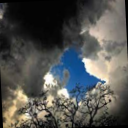
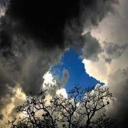
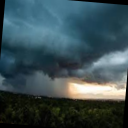
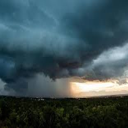
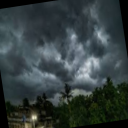
...
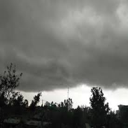
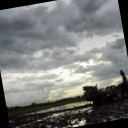
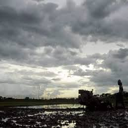
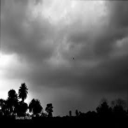
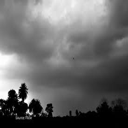

In [ ]:
image_directory = '/content/drive/MyDrive/R&D Project/idt2/rain/'
image_files = os.listdir(image_directory)
image_paths = [os.path.join(image_directory, filename) for filename in image_files]
rotate = ia.Affine(rotate=(-15, 15))
augmented_images = []
labels = []
for image_path in image_paths:
    input_img = Image.open(image_path)
    input_img_rgb = input_img.convert('RGB')
    input_img_array = np.array(input_img_rgb)
    input_aug_rotate = rotate.augment_image(input_img_array)
    augmented_images.append(input_aug_rotate)
    labels.append('Rotated')
    augmented_images = [ia.imresize_single_image(image, (input_img_array.shape[1], input_img_array.shape[0])) for image in augmented_images]
    augmented_images.append(input_img_array)
    labels.append('Original')
for i, image in enumerate(augmented_images):
    PIL.Image.fromarray(image).save(f'/content/drive/MyDrive/R&D Project/augmented_idt/rain/aug_{i}.png')
ipyplot.plot_images(augmented_images, labels=labels, img_width=125)


***No Rainfall Images***


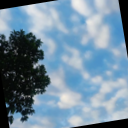
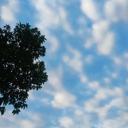
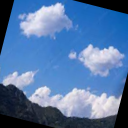
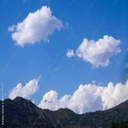
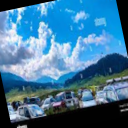
...
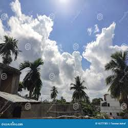
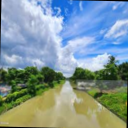
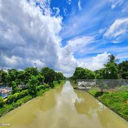
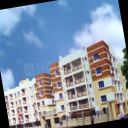
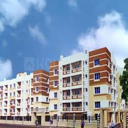

In [ ]:
image_directory = '/content/drive/MyDrive/R&D Project/idt2/no_rain/'
image_files = os.listdir(image_directory)
image_paths = [os.path.join(image_directory, filename) for filename in image_files]
rotate = ia.Affine(rotate=(-15, 15))
augmented_images = []
labels = []
for image_path in image_paths:
    input_img = Image.open(image_path)
    input_img_array = np.array(input_img)
    input_aug_rotate = rotate.augment_image(input_img_array)
    augmented_images.append(input_aug_rotate)
    labels.append('Rotated')
    augmented_images = [ia.imresize_single_image(image, (input_img_array.shape[1], input_img_array.shape[0])) for image in augmented_images]
    augmented_images.append(input_img_array)
    labels.append('Original')
for i, image in enumerate(augmented_images):
    PIL.Image.fromarray(image).save(f'/content/drive/MyDrive/R&D Project/augmented_idt/no_rain/aug_{i}.png')
ipyplot.plot_images(augmented_images, labels=labels, img_width=125)


Number of rainfall images: 750
Number of no rainfall images: 250


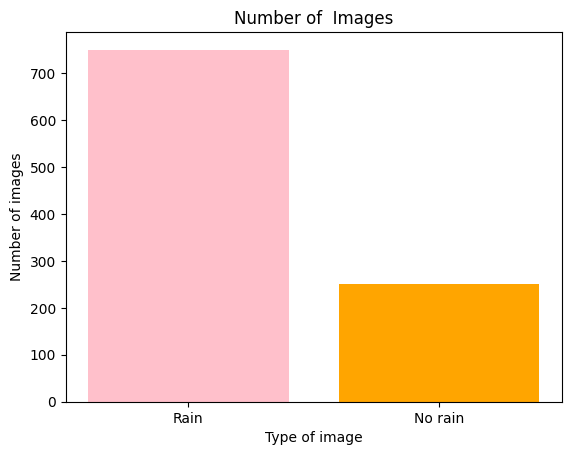

In [ ]:
def get_number_of_images(folder_path):
  number_of_images = 0
  for file in os.listdir(folder_path):
    if file.endswith(".png") or file.endswith(".jpg"):
      number_of_images += 1
  return number_of_images
if __name__ == "__main__":
  number_of_images_in_rain_images_folder = get_number_of_images("/content/drive/MyDrive/R&D Project/idt2/rain")
  print("Number of rainfall images:", number_of_images_in_rain_images_folder)
  number_of_images_in_no_rain_images_folder = get_number_of_images("/content/drive/MyDrive/R&D Project/idt2/no_rain")
  print("Number of no rainfall images:", number_of_images_in_no_rain_images_folder)
  number_of_images_list = [number_of_images_in_rain_images_folder, number_of_images_in_no_rain_images_folder ]
  colors = ['pink', 'orange']
  plt.bar(['Rain', 'No rain'], number_of_images_list, color=colors)
  plt.title('Number of  Images')
  plt.xlabel('Type of image')
  plt.ylabel('Number of images')
  plt.show()

***Count of rain and no rain images before and after augmentation***

In [ ]:
# def get_number_of_images(folder_path):
#   number_of_images = 0
#   for file in os.listdir(folder_path):
#     if file.endswith(".png"):
#       number_of_images += 1
#   return number_of_images
# if __name__ == "__main__":
#   number_of_images_in_rain_images_folder = get_number_of_images("/content/drive/MyDrive/R&D Project/idt2/rain")
#   print("Number of no augmented rainfall images:", number_of_images_in_rain_images_folder)
#   number_of_images_in_no_rain_images_folder = get_number_of_images("/content/drive/MyDrive/R&D Project/idt2/no_rain")
#   print("Number of no augmented no rainfall images:", number_of_images_in_no_rain_images_folder)
#   number_of_images_in_augrain_images_folder = get_number_of_images("/content/drive/MyDrive/R&D Project/augmented_idt/rain")
#   print("Number of augmented rainfall images:", number_of_images_in_augrain_images_folder)
#   number_of_images_in_augnorain_images_folder = get_number_of_images("/content/drive/MyDrive/R&D Project/augmented_idt/no_rain")
#   print("Number of augmented no rainfall images:",number_of_images_in_augnorain_images_folder)
#   number_of_images_list = [number_of_images_in_rain_images_folder, number_of_images_in_no_rain_images_folder, number_of_images_in_augrain_images_folder, number_of_images_in_augnorain_images_folder ]
#   colors = ['red', 'green', 'orange', 'blue']
#   plt.bar(['Rain', 'No rain', 'Augmented Rain','Augmented No rain'], number_of_images_list, color=colors)
#   plt.title('Number of Total,Day and Night Images')
#   plt.xlabel('Type of image')
#   plt.ylabel('Number of images')
#   plt.show()

***Split folders***

In [3]:
splitfolders.ratio('../content/drive/MyDrive/R&D Project/augmented_idt/', output="output", seed=1345, ratio=(.8, 0.1,0.1))

Copying files: 2000 files [00:51, 38.47 files/s] 


***Train,Validation and Test***

In [4]:
IMG_HEIGHT = 128
IMG_WIDTH = 128
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
"./output/train",
seed=123,
image_size=(IMG_HEIGHT, IMG_WIDTH),
batch_size=64
)
test_ds = tf.keras.preprocessing.image_dataset_from_directory(
"./output/test",
seed=123,
image_size=(IMG_HEIGHT, IMG_WIDTH),
batch_size=64
)
val_ds = tf.keras.preprocessing.image_dataset_from_directory(
"./output/val",
seed=123,
image_size=(IMG_HEIGHT, IMG_WIDTH),
batch_size=64
)

Found 1600 files belonging to 2 classes.
Found 200 files belonging to 2 classes.
Found 200 files belonging to 2 classes.


***Train Class name***

In [ ]:
class_names = train_ds.class_names
print(class_names)
train_ds

['no_rain', 'rain']


<_BatchDataset element_spec=(TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>

***Sample Images before prediction***

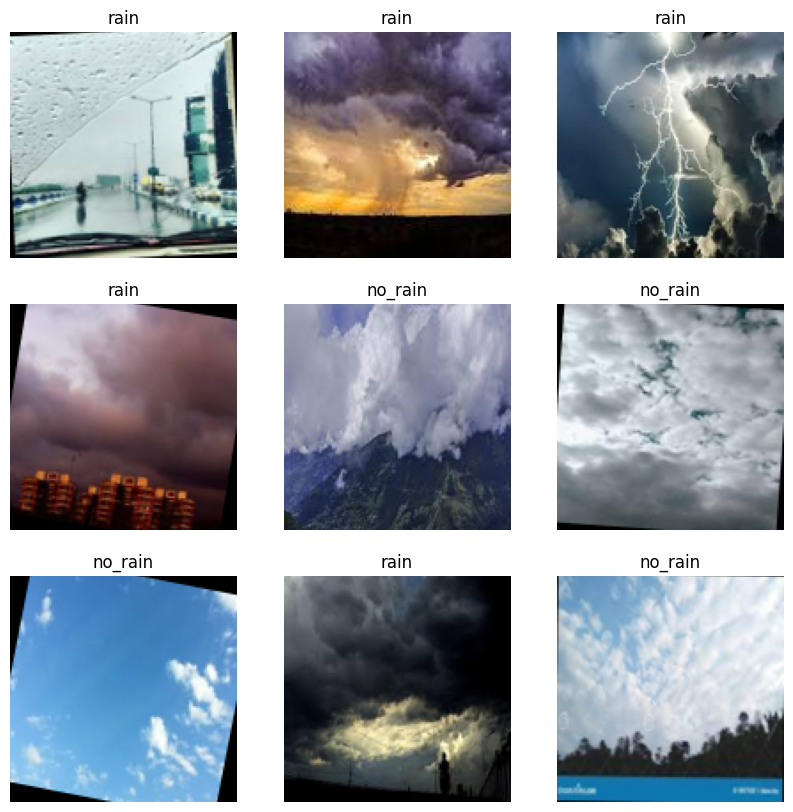

In [ ]:
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

***CNN-ADAM***

***Build model***

In [ ]:
model = keras.models.Sequential()
model.add(keras.layers.experimental.preprocessing.Rescaling(1./255, input_shape=(IMG_HEIGHT,IMG_WIDTH, 3)))
model.add(keras.layers.Conv2D(filters=16,kernel_size=(3,3),padding='same',activation='relu',kernel_initializer="he_normal"))
model.add(keras.layers.MaxPooling2D(pool_size=(2,2)))


model.add(keras.layers.Conv2D(filters=32,kernel_size=(3,3),padding='same',activation='relu',kernel_initializer="he_normal"))
model.add(keras.layers.MaxPooling2D(pool_size=(2,2)))

model.add(keras.layers.Dropout(0.20))

model.add(keras.layers.Conv2D(filters=64,kernel_size=(3,3),padding='same',activation='relu',kernel_initializer="he_normal"))
model.add(keras.layers.MaxPooling2D(pool_size=(2,2)))

model.add(keras.layers.Dropout(0.25))
model.add(keras.layers.Flatten())
model.add(keras.layers.Dense(128,activation="relu",kernel_initializer="he_normal"))
model.add(keras.layers.Dense(64,"relu"))
model.add(keras.layers.Dense(6,"softmax"))

***Compile model***

In [ ]:
model.compile(loss="sparse_categorical_crossentropy",
              optimizer = "adam",metrics=["accuracy"])

***Summary of layers used in CNN model***

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 128, 128, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 128, 128, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 64, 64, 16)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 64, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 32, 32, 32)        0         
 g2D)                                                            
                                                                 
 dropout (Dropout)           (None, 32, 32, 32)        0

***Train and Validate CNN model***

In [ ]:
hist = model.fit(train_ds,validation_data=val_ds,epochs=30, batch_size=64, verbose=1)

Epoch 1/30
25/25 [==============================] - 14s 55ms/step - loss: 0.7791 - accuracy: 0.7394 - val_loss: 0.5262 - val_accuracy: 0.8150
Epoch 2/30
25/25 [==============================] - 3s 82ms/step - loss: 0.3631 - accuracy: 0.8587 - val_loss: 0.4629 - val_accuracy: 0.7500
Epoch 3/30
25/25 [==============================] - 1s 47ms/step - loss: 0.2881 - accuracy: 0.8863 - val_loss: 0.3750 - val_accuracy: 0.8650
Epoch 4/30
25/25 [==============================] - 2s 49ms/step - loss: 0.2220 - accuracy: 0.9100 - val_loss: 0.2266 - val_accuracy: 0.9150
Epoch 5/30
25/25 [==============================] - 2s 54ms/step - loss: 0.1739 - accuracy: 0.9356 - val_loss: 0.1895 - val_accuracy: 0.9550
Epoch 6/30
25/25 [==============================] - 1s 47ms/step - loss: 0.1452 - accuracy: 0.9431 - val_loss: 0.1988 - val_accuracy: 0.9300
Epoch 7/30
25/25 [==============================] - 2s 58ms/step - loss: 0.1488 - accuracy: 0.9475 - val_loss: 0.2025 - val_accuracy: 0.9650
Epoch 8/30
2

In [ ]:
get_ac1 = hist.history['accuracy']
get_los1 = hist.history['loss']
val_acc1 = hist.history['val_accuracy']
val_loss1 = hist.history['val_loss']

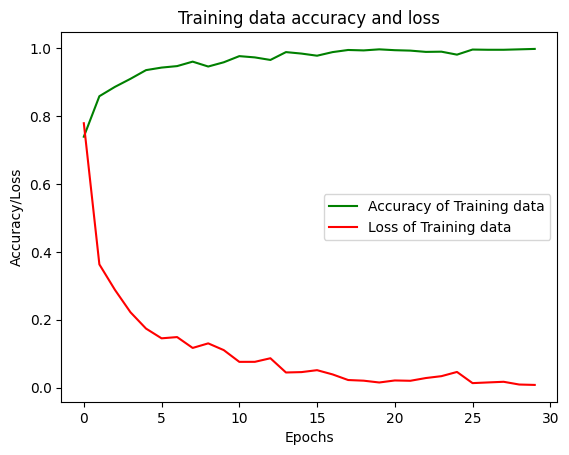

In [ ]:
epochs = range(len(get_ac1))
plt.plot(epochs, get_ac1, 'g', label='Accuracy of Training data')
plt.plot(epochs, get_los1, 'r', label='Loss of Training data')
plt.title('Training data accuracy and loss')
plt.legend(loc=0)
plt.xlabel('Epochs')
plt.ylabel('Accuracy/Loss')
plt.figure()

plt.plot(epochs, get_ac1, 'g', label='Accuracy of Training Data')
plt.plot(epochs, val_acc1, 'r', label='Accuracy of Validation Data')
plt.title('Training and Validation Accuracy')
plt.legend(loc=0)
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.figure()

plt.plot(epochs, get_los1, 'g', label='Loss of Training Data')
plt.plot(epochs, val_loss1, 'r', label='Loss of Validation Data')
plt.title('Training and Validation Loss')
plt.legend(loc=0)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.figure()
plt.show()

<ipython-input-20-f3d5ad097424>:4: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(4, 4, i + 1)


1/1 [==============================] - 0s 20ms/step


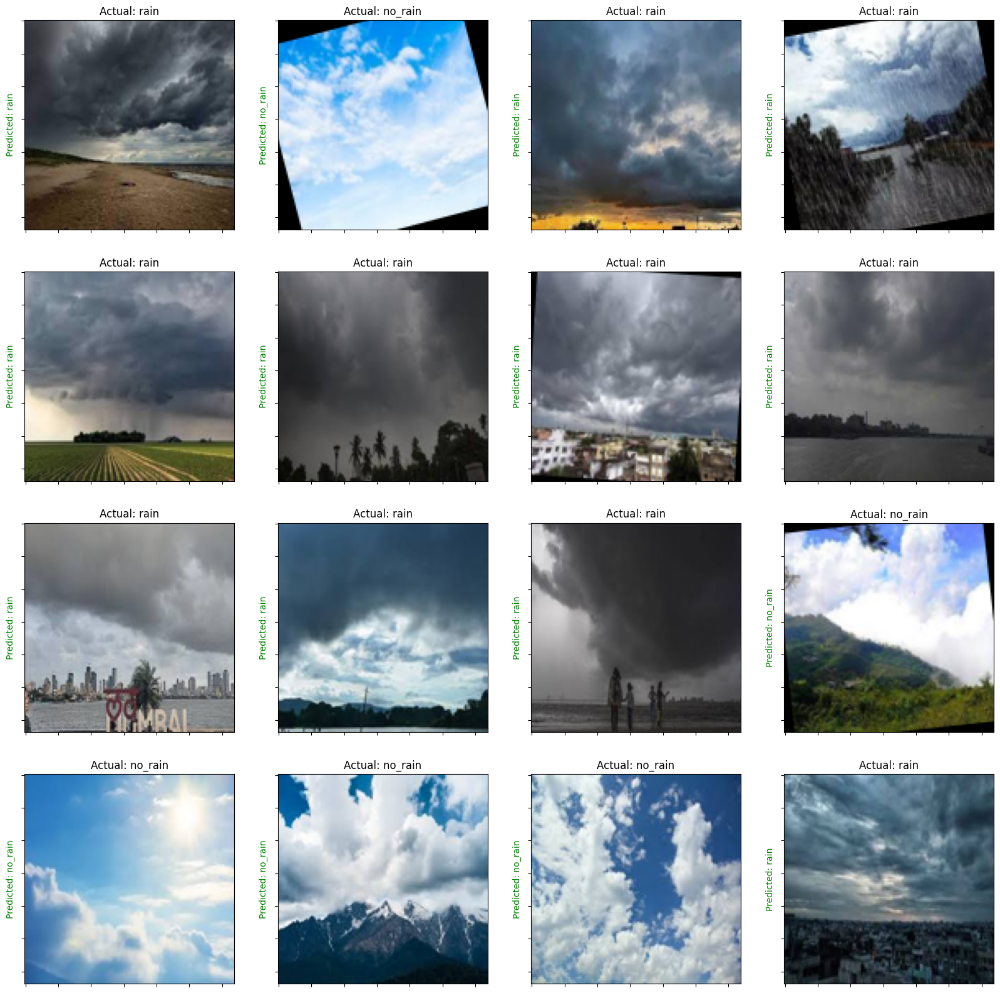

In [ ]:
plt.subplots(figsize=(20, 20))
for images, labels in test_ds.take(1):
    for i in range(16):
        ax = plt.subplot(4, 4, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        predictions = model.predict(tf.expand_dims(images[i], 0))
        score = tf.nn.softmax(predictions[0])
        if(class_names[labels[i]]==class_names[np.argmax(score)]):
            plt.title("Actual: "+class_names[labels[i]])
            plt.ylabel("Predicted: "+class_names[np.argmax(score)],fontdict={'color':'green'})

        else:
            plt.title("Actual: "+class_names[labels[i]])
            plt.ylabel("Predicted: "+class_names[np.argmax(score)],fontdict={'color':'red'})
        plt.gca().axes.yaxis.set_ticklabels([])
        plt.gca().axes.xaxis.set_ticklabels([])

In [ ]:
for img, label in test_ds.take(1):
    print(label, len(label))
    break

tf.Tensor(
[1 0 0 0 1 0 1 1 1 1 0 0 1 1 1 0 1 1 0 1 1 1 0 1 1 1 1 1 0 1 1 1 1 1 0 1 1
 1 1 0 1 1 1 1 0 1 1 0 1 0 1 0 1 0 1 1 1 1 0 1 0 1 0 1], shape=(64,), dtype=int32) 64


In [ ]:
actual_label = []
pred_label = []
for img, label in test_ds.take(1):
    pred = model.predict(img)
    pred = np.argmax(pred, axis=1)
    print(classification_report(label,pred))

2/2 [==============================] - 0s 10ms/step
              precision    recall  f1-score   support

           0       0.80      1.00      0.89        12
           1       1.00      0.94      0.97        52

    accuracy                           0.95        64
   macro avg       0.90      0.97      0.93        64
weighted avg       0.96      0.95      0.96        64



In [ ]:
loss1,accuracy1 = model.evaluate(test_ds)
print(loss1,accuracy1)

4/4 [==============================] - 0s 15ms/step - loss: 0.0927 - accuracy: 0.9650
0.09269706904888153 0.9649999737739563


***RNN(LSTM)***

In [ ]:
model = keras.models.Sequential()
model.add(keras.layers.experimental.preprocessing.Rescaling(1./255, input_shape=(IMG_HEIGHT,IMG_WIDTH, 3)))
model.add(keras.layers.Flatten())
model.add(keras.layers.Reshape((1, IMG_HEIGHT * IMG_WIDTH * 3)))
model.add(keras.layers.LSTM(64, input_shape=(1, IMG_HEIGHT * IMG_WIDTH * 3), return_sequences=True))
model.add(keras.layers.LSTM(32, return_sequences=True))
model.add(keras.layers.LSTM(16))
model.add(keras.layers.Dropout(0.25))
model.add(keras.layers.Dense(128, activation="relu", kernel_initializer="he_normal"))
model.add(keras.layers.Dense(64, "relu"))
model.add(keras.layers.Dense(6, "softmax"))

In [ ]:
model.compile(loss="sparse_categorical_crossentropy",
              optimizer = "adam",metrics=["accuracy"])

In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_1 (Rescaling)     (None, 128, 128, 3)       0         
                                                                 
 flatten_1 (Flatten)         (None, 49152)             0         
                                                                 
 reshape (Reshape)           (None, 1, 49152)          0         
                                                                 
 lstm (LSTM)                 (None, 1, 64)             12599552  
                                                                 
 lstm_1 (LSTM)               (None, 1, 32)             12416     
                                                                 
 lstm_2 (LSTM)               (None, 16)                3136      
                                                                 
 dropout_2 (Dropout)         (None, 16)               

In [ ]:
hist = model.fit(train_ds,validation_data=val_ds,epochs=30, batch_size=64, verbose=1)

Epoch 1/30
25/25 [==============================] - 10s 82ms/step - loss: 1.3814 - accuracy: 0.7138 - val_loss: 0.7800 - val_accuracy: 0.7500
Epoch 2/30
25/25 [==============================] - 1s 48ms/step - loss: 0.6403 - accuracy: 0.7494 - val_loss: 0.5699 - val_accuracy: 0.7500
Epoch 3/30
25/25 [==============================] - 2s 76ms/step - loss: 0.5706 - accuracy: 0.7500 - val_loss: 0.5639 - val_accuracy: 0.7500
Epoch 4/30
25/25 [==============================] - 2s 60ms/step - loss: 0.5653 - accuracy: 0.7500 - val_loss: 0.5639 - val_accuracy: 0.7500
Epoch 5/30
25/25 [==============================] - 1s 43ms/step - loss: 0.5696 - accuracy: 0.7500 - val_loss: 0.5659 - val_accuracy: 0.7500
Epoch 6/30
25/25 [==============================] - 1s 43ms/step - loss: 0.5714 - accuracy: 0.7500 - val_loss: 0.5680 - val_accuracy: 0.7500
Epoch 7/30
25/25 [==============================] - 1s 44ms/step - loss: 0.5673 - accuracy: 0.7500 - val_loss: 0.5658 - val_accuracy: 0.7500
Epoch 8/30
2

In [ ]:
get_ac2 = hist.history['accuracy']
get_los2 = hist.history['loss']
val_acc2 = hist.history['val_accuracy']
val_loss2 = hist.history['val_loss']

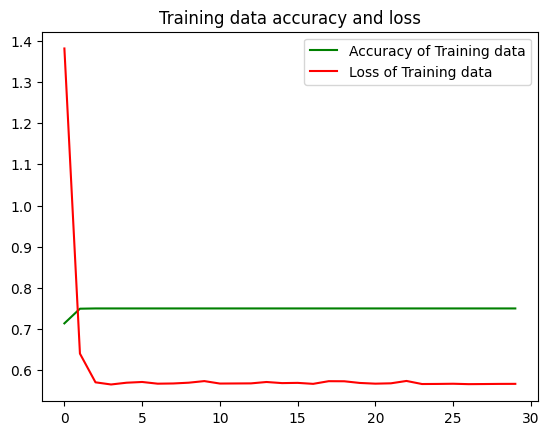

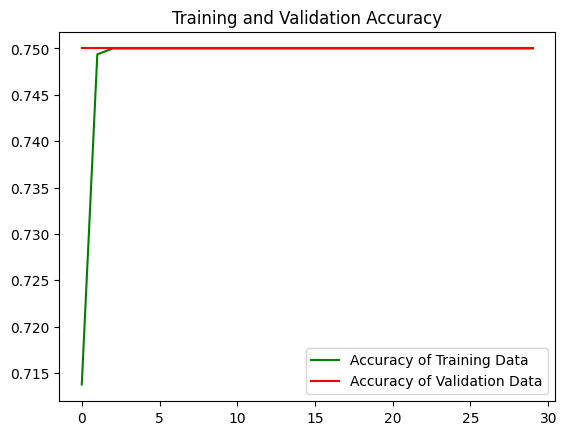

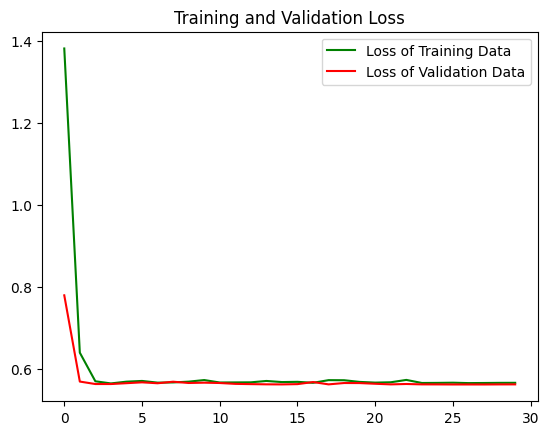

<Figure size 640x480 with 0 Axes>

In [ ]:
epochs = range(len(get_ac2))
plt.plot(epochs, get_ac2, 'g', label='Accuracy of Training data')
plt.plot(epochs, get_los2, 'r', label='Loss of Training data')
plt.title('Training data accuracy and loss')
plt.legend(loc=0)
plt.xlabel('Epochs')
plt.ylabel('Accuracy/Loss')
plt.figure()

plt.plot(epochs, get_ac2, 'g', label='Accuracy of Training Data')
plt.plot(epochs, val_acc2, 'r', label='Accuracy of Validation Data')
plt.title('Training and Validation Accuracy')
plt.legend(loc=0)
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.figure()

plt.plot(epochs, get_los2, 'g', label='Loss of Training Data')
plt.plot(epochs, val_loss2, 'r', label='Loss of Validation Data')
plt.title('Training and Validation Loss')
plt.legend(loc=0)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.figure()
plt.show()

<ipython-input-30-4e9488dffff0>:4: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(4, 4, i + 1)


1/1 [==============================] - 0s 19ms/step


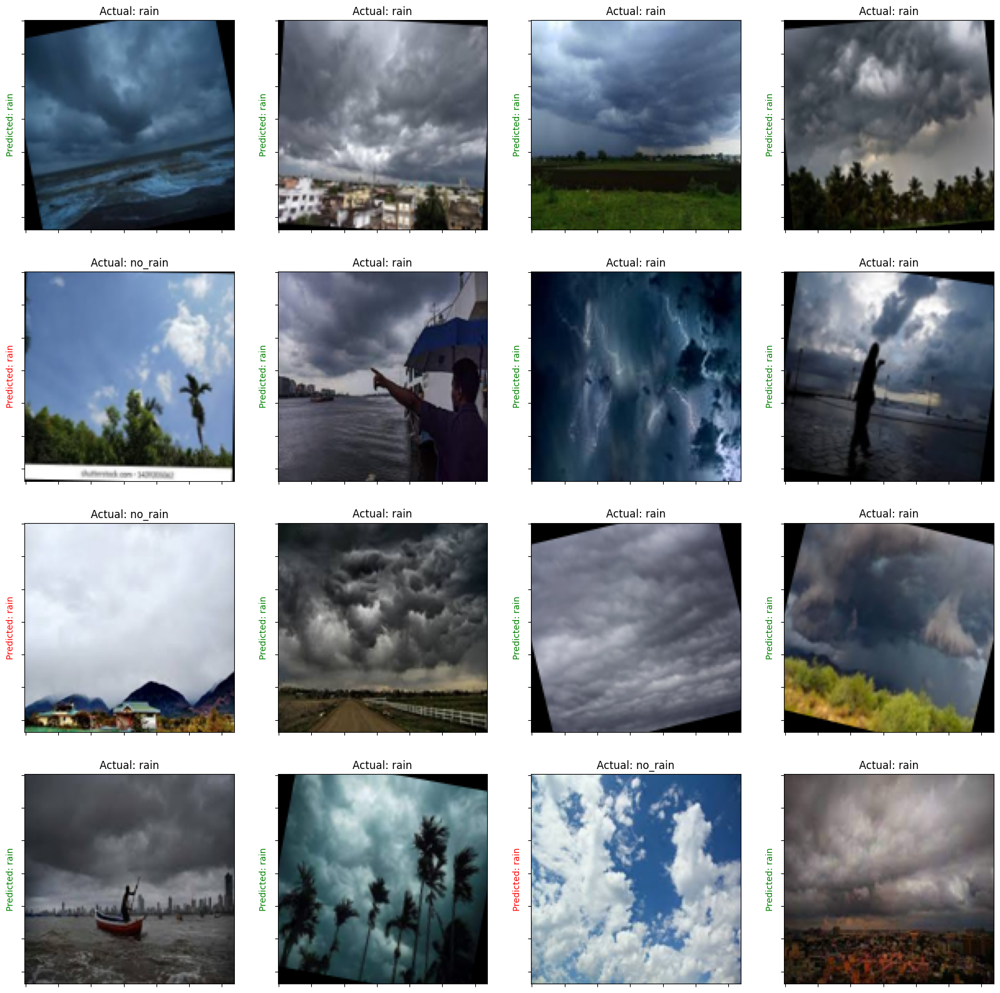

In [ ]:
plt.subplots(figsize=(20, 20))
for images, labels in test_ds.take(1):
    for i in range(16):
        ax = plt.subplot(4, 4, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        predictions = model.predict(tf.expand_dims(images[i], 0))
        score = tf.nn.softmax(predictions[0])
        if(class_names[labels[i]]==class_names[np.argmax(score)]):
            plt.title("Actual: "+class_names[labels[i]])
            plt.ylabel("Predicted: "+class_names[np.argmax(score)],fontdict={'color':'green'})
        else:
            plt.title("Actual: "+class_names[labels[i]])
            plt.ylabel("Predicted: "+class_names[np.argmax(score)],fontdict={'color':'red'})
        plt.gca().axes.yaxis.set_ticklabels([])
        plt.gca().axes.xaxis.set_ticklabels([])

In [ ]:
for img, label in test_ds.take(1):
    print(label, len(label))
    break

tf.Tensor(
[1 0 1 0 1 1 1 1 1 0 1 1 1 1 0 1 1 0 1 0 1 1 1 1 1 0 1 1 1 0 1 1 0 0 0 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 0 1 0 1 1 1 1 1 1 1 0 1], shape=(64,), dtype=int32) 64


In [ ]:
loss2, accuracy2 = model.evaluate(test_ds)
print(loss2,accuracy2)

4/4 [==============================] - 0s 15ms/step - loss: 0.5630 - accuracy: 0.7500
0.5630236268043518 0.75


In [ ]:
actual_label = []
pred_label = []
for img, label in test_ds.take(1):
    pred = model.predict(img)
    pred = np.argmax(pred, axis=1)
    a1=classification_report(label,pred)
    print(a1)

2/2 [==============================] - 0s 9ms/step
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        16
           1       0.75      1.00      0.86        48

    accuracy                           0.75        64
   macro avg       0.38      0.50      0.43        64
weighted avg       0.56      0.75      0.64        64



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


***DNN-ADAM***

In [ ]:
model = keras.models.Sequential()
model.add(keras.layers.experimental.preprocessing.Rescaling(1./255, input_shape=(IMG_HEIGHT,IMG_WIDTH, 3)))
# Replace convolutional layers with feedforward neural network layers
model.add(keras.layers.Flatten())
model.add(keras.layers.Dense(128, activation="relu", kernel_initializer="he_normal"))
model.add(keras.layers.Dense(64, activation="relu", kernel_initializer="he_normal"))
model.add(keras.layers.Dense(6, "softmax"))


In [ ]:
model.compile(loss="sparse_categorical_crossentropy",
              optimizer = "adam",metrics=["accuracy"])

In [ ]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_2 (Rescaling)     (None, 128, 128, 3)       0         
                                                                 
 flatten_2 (Flatten)         (None, 49152)             0         
                                                                 
 dense_6 (Dense)             (None, 128)               6291584   
                                                                 
 dense_7 (Dense)             (None, 64)                8256      
                                                                 
 dense_8 (Dense)             (None, 6)                 390       
                                                                 
Total params: 6300230 (24.03 MB)
Trainable params: 6300230 (24.03 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
hist = model.fit(train_ds,validation_data=val_ds,epochs=30, batch_size=64, verbose=1)

Epoch 1/30
25/25 [==============================] - 2s 39ms/step - loss: 7.1000 - accuracy: 0.6400 - val_loss: 2.6563 - val_accuracy: 0.7700
Epoch 2/30
25/25 [==============================] - 1s 38ms/step - loss: 2.3374 - accuracy: 0.7356 - val_loss: 1.4548 - val_accuracy: 0.8300
Epoch 3/30
25/25 [==============================] - 1s 36ms/step - loss: 2.6167 - accuracy: 0.7294 - val_loss: 2.2759 - val_accuracy: 0.5550
Epoch 4/30
25/25 [==============================] - 1s 37ms/step - loss: 2.6628 - accuracy: 0.7275 - val_loss: 1.9841 - val_accuracy: 0.6400
Epoch 5/30
25/25 [==============================] - 1s 36ms/step - loss: 1.1159 - accuracy: 0.7738 - val_loss: 0.6959 - val_accuracy: 0.8100
Epoch 6/30
25/25 [==============================] - 1s 37ms/step - loss: 0.8963 - accuracy: 0.7812 - val_loss: 0.9624 - val_accuracy: 0.8100
Epoch 7/30
25/25 [==============================] - 1s 45ms/step - loss: 0.9022 - accuracy: 0.7831 - val_loss: 0.7728 - val_accuracy: 0.7150
Epoch 8/30
25

In [ ]:
get_ac3 = hist.history['accuracy']
get_los3 = hist.history['loss']
val_acc3 = hist.history['val_accuracy']
val_loss3 = hist.history['val_loss']

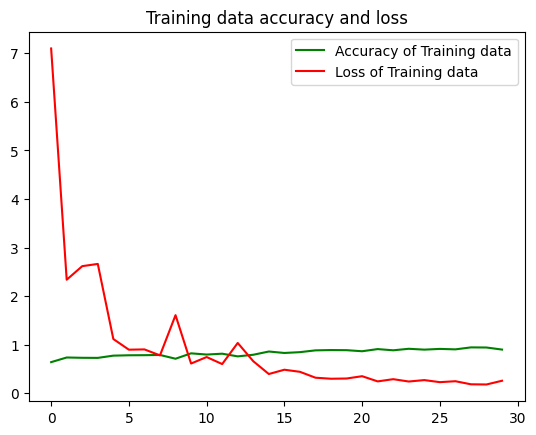

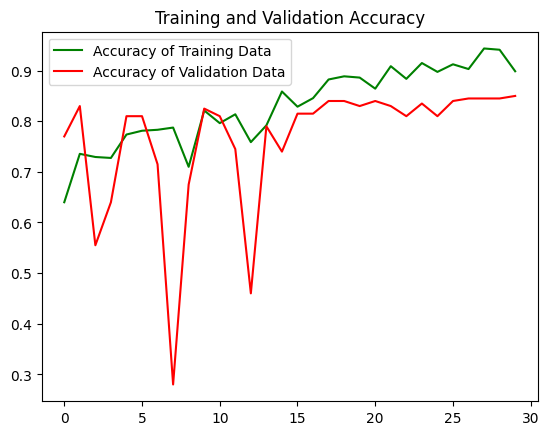

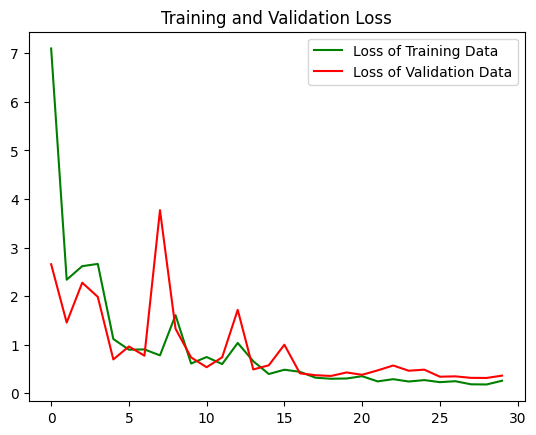

<Figure size 640x480 with 0 Axes>

In [ ]:
epochs = range(len(get_ac3))
plt.plot(epochs, get_ac3, 'g', label='Accuracy of Training data')
plt.plot(epochs, get_los3, 'r', label='Loss of Training data')
plt.title('Training data accuracy and loss')
plt.legend(loc=0)
plt.xlabel('Epochs')
plt.ylabel('Accuracy/Loss')
plt.figure()

plt.plot(epochs, get_ac3, 'g', label='Accuracy of Training Data')
plt.plot(epochs, val_acc3, 'r', label='Accuracy of Validation Data')
plt.title('Training and Validation Accuracy')
plt.legend(loc=0)
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.figure()

plt.plot(epochs, get_los3, 'g', label='Loss of Training Data')
plt.plot(epochs, val_loss3, 'r', label='Loss of Validation Data')
plt.title('Training and Validation Loss')
plt.legend(loc=0)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.figure()
plt.show()

1/1 [==============================] - 0s 66ms/step


<ipython-input-40-f3d5ad097424>:4: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(4, 4, i + 1)


1/1 [==============================] - 0s 21ms/step


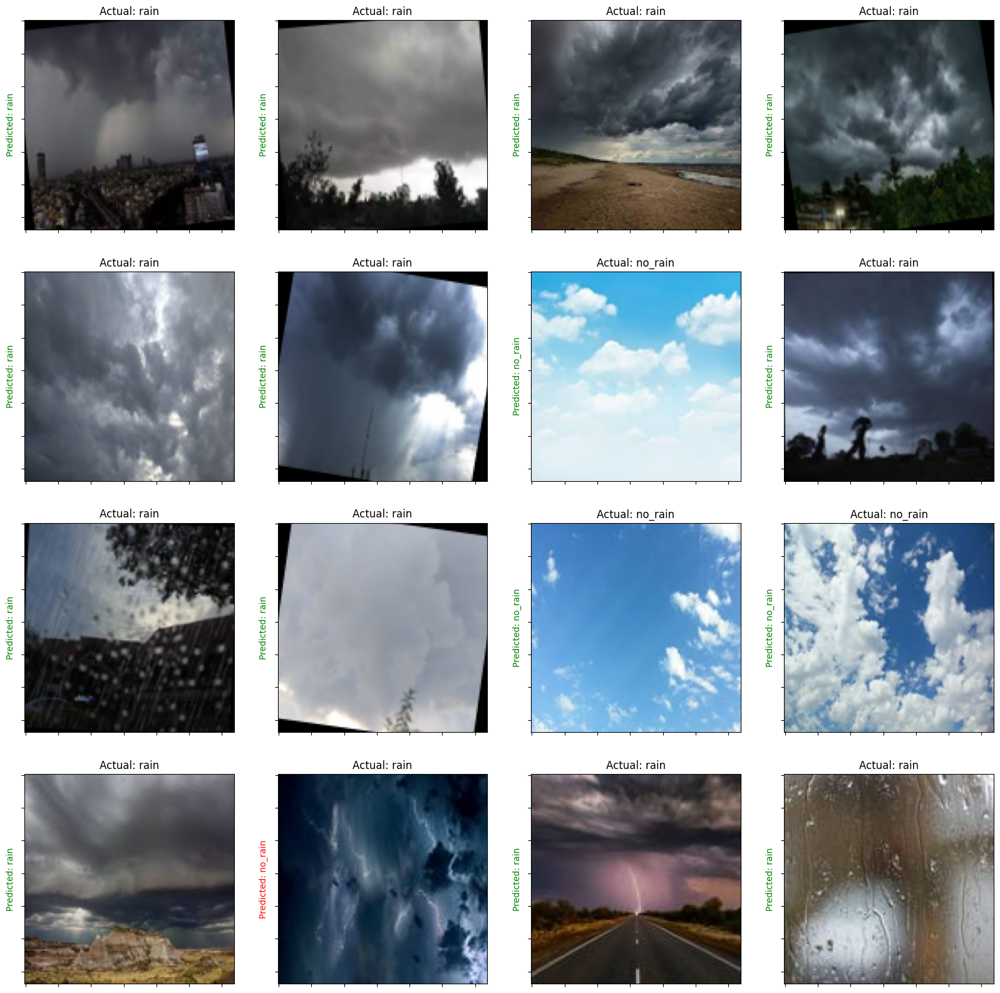

In [ ]:
plt.subplots(figsize=(20, 20))
for images, labels in test_ds.take(1):
    for i in range(16):
        ax = plt.subplot(4, 4, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        predictions = model.predict(tf.expand_dims(images[i], 0))
        score = tf.nn.softmax(predictions[0])
        if(class_names[labels[i]]==class_names[np.argmax(score)]):
            plt.title("Actual: "+class_names[labels[i]])
            plt.ylabel("Predicted: "+class_names[np.argmax(score)],fontdict={'color':'green'})

        else:
            plt.title("Actual: "+class_names[labels[i]])
            plt.ylabel("Predicted: "+class_names[np.argmax(score)],fontdict={'color':'red'})
        plt.gca().axes.yaxis.set_ticklabels([])
        plt.gca().axes.xaxis.set_ticklabels([])

In [ ]:
for img, label in test_ds.take(1):
    print(label, len(label))
    break

tf.Tensor(
[1 1 1 1 1 1 1 1 1 1 0 0 0 1 1 0 1 1 0 0 1 0 1 1 1 1 1 1 1 0 1 0 1 1 0 1 0
 1 1 0 1 1 1 1 0 1 1 0 1 1 1 1 0 1 1 0 1 1 1 1 1 1 0 1], shape=(64,), dtype=int32) 64


In [ ]:
actual_label = []
pred_label = []
for img, label in test_ds.take(1):
    pred = model.predict(img)
    pred = np.argmax(pred, axis=1)
    print(classification_report(label,pred))

2/2 [==============================] - 0s 7ms/step
              precision    recall  f1-score   support

           0       0.90      0.53      0.67        17
           1       0.85      0.98      0.91        47

    accuracy                           0.86        64
   macro avg       0.88      0.75      0.79        64
weighted avg       0.86      0.86      0.85        64



In [ ]:
loss3, accuracy3 = model.evaluate(test_ds)
print(loss3,accuracy3)

4/4 [==============================] - 0s 8ms/step - loss: 0.4043 - accuracy: 0.8650
0.4042768180370331 0.8650000095367432


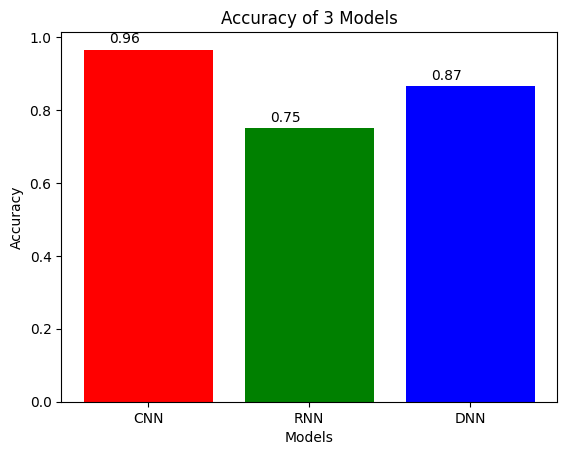

In [ ]:
accuracy_values = [accuracy1, accuracy2, accuracy3]
colors = ['red', 'green', 'blue']

# Create a bar chart
bar_chart = plt.bar(['CNN', 'RNN', 'DNN'], accuracy_values, color=colors)

# Add accuracy values above the bars
for bar in bar_chart:
    y = bar.get_height()
    plt.text(bar.get_x() + 0.25, y + 0.01, f'{y:.2f}', ha='center', va='bottom')

# Set labels and title
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.title('Accuracy of 3 Models')

# Show the plot
plt.show()

***RESNET-50***

In [ ]:
model = keras.models.Sequential()
model.add(keras.layers.experimental.preprocessing.Rescaling(1./255, input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)))
model.add(keras.applications.ResNet50(include_top=False, input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)))
model.add(keras.layers.GlobalAveragePooling2D())
model.add(keras.layers.Dense(128, activation="relu", kernel_initializer="he_normal"))
model.add(keras.layers.Dense(64, "relu"))
model.add(keras.layers.Dense(6, "softmax"))

94765736/94765736 [==============================] - 5s 0us/step


In [ ]:
model.compile(loss="sparse_categorical_crossentropy",
              optimizer = "adam",metrics=["accuracy"])

In [ ]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_3 (Rescaling)     (None, 128, 128, 3)       0         
                                                                 
 resnet50 (Functional)       (None, 4, 4, 2048)        23587712  
                                                                 
 global_average_pooling2d (  (None, 2048)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense_9 (Dense)             (None, 128)               262272    
                                                                 
 dense_10 (Dense)            (None, 64)                8256      
                                                                 
 dense_11 (Dense)            (None, 6)                 390       
                                                      

In [ ]:
hist = model.fit(train_ds,validation_data=val_ds,epochs=30, batch_size=64, verbose=1)

Epoch 1/30
25/25 [==============================] - 49s 313ms/step - loss: 0.3070 - accuracy: 0.9000 - val_loss: 138.1250 - val_accuracy: 0.2500
Epoch 2/30
14/25 [===============>..............] - ETA: 2s - loss: 0.1121 - accuracy: 0.9565

In [ ]:
get_ac4 = hist.history['accuracy']
get_los4 = hist.history['loss']
val_acc4 = hist.history['val_accuracy']
val_loss4 = hist.history['val_loss']

In [ ]:
epochs = range(len(get_ac4))
plt.plot(epochs, get_ac4, 'g', label='Accuracy of Training data')
plt.plot(epochs, get_los4, 'r', label='Loss of Training data')
plt.title('Training data accuracy and loss')
plt.legend(loc=0)
plt.xlabel('Epochs')
plt.ylabel('Accuracy/Loss')
plt.figure()

plt.plot(epochs, get_ac4, 'g', label='Accuracy of Training Data')
plt.plot(epochs, val_acc4, 'r', label='Accuracy of Validation Data')
plt.title('Training and Validation Accuracy')
plt.legend(loc=0)
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.figure()

plt.plot(epochs, get_los4, 'g', label='Loss of Training Data')
plt.plot(epochs, val_loss4, 'r', label='Loss of Validation Data')
plt.title('Training and Validation Loss')
plt.legend(loc=0)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.figure()
plt.show()

<ipython-input-51-f3d5ad097424>:4: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(4, 4, i + 1)


1/1 [==============================] - 0s 29ms/step


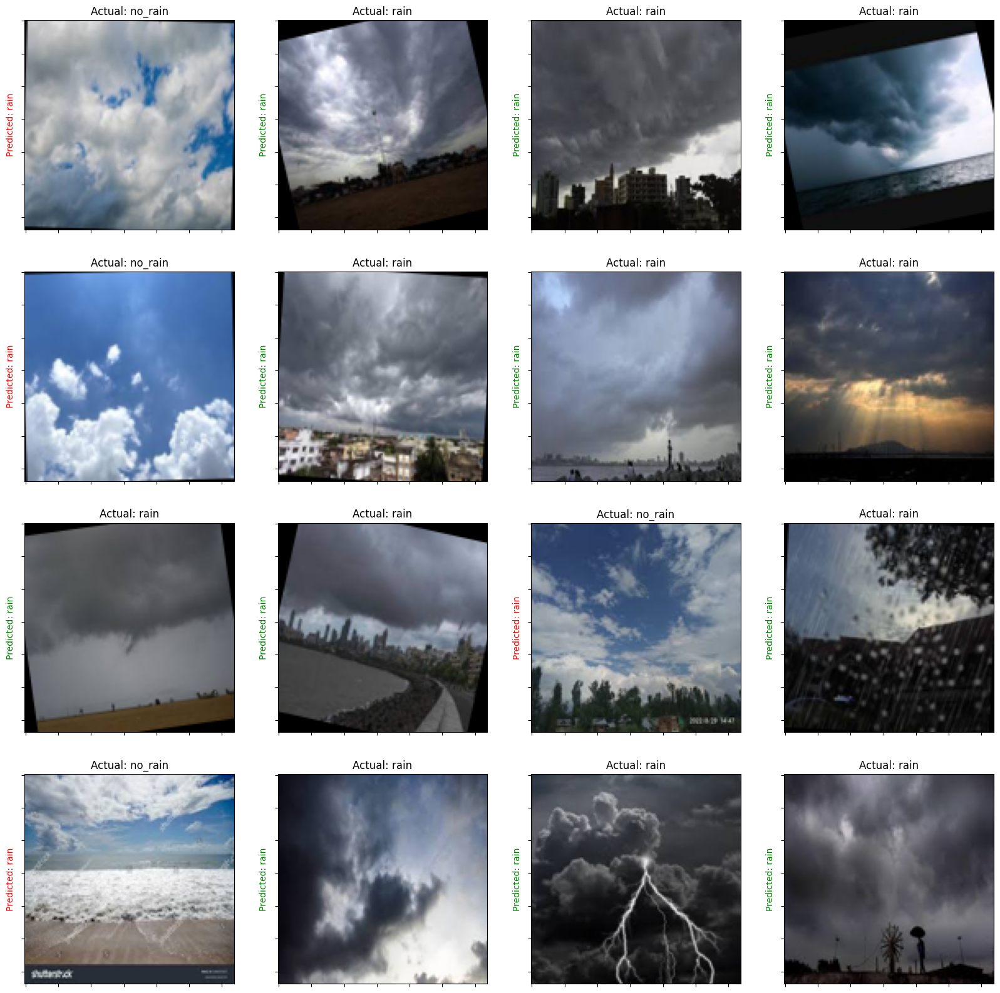

In [ ]:
plt.subplots(figsize=(20, 20))
for images, labels in test_ds.take(1):
    for i in range(16):
        ax = plt.subplot(4, 4, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        predictions = model.predict(tf.expand_dims(images[i], 0))
        score = tf.nn.softmax(predictions[0])
        if(class_names[labels[i]]==class_names[np.argmax(score)]):
            plt.title("Actual: "+class_names[labels[i]])
            plt.ylabel("Predicted: "+class_names[np.argmax(score)],fontdict={'color':'green'})

        else:
            plt.title("Actual: "+class_names[labels[i]])
            plt.ylabel("Predicted: "+class_names[np.argmax(score)],fontdict={'color':'red'})
        plt.gca().axes.yaxis.set_ticklabels([])
        plt.gca().axes.xaxis.set_ticklabels([])

In [ ]:
for img, label in test_ds.take(1):
    print(label, len(label))
    break

tf.Tensor(
[1 0 1 1 1 1 0 1 0 0 1 0 1 1 1 1 1 1 1 0 0 0 1 1 1 0 1 1 1 1 1 1 1 1 0 0 1
 1 0 0 0 1 1 1 0 1 1 1 1 0 1 1 1 1 1 0 1 0 0 1 1 1 1 0], shape=(64,), dtype=int32) 64


In [ ]:
loss4, accuracy4 = model.evaluate(test_ds)
print(loss4,accuracy4)

4/4 [==============================] - 0s 67ms/step - loss: 3.2804 - accuracy: 0.7550
3.2803661823272705 0.7549999952316284


In [ ]:
actual_label = []
pred_label = []
for img, label in test_ds.take(1):
    pred = model.predict(img)
    pred = np.argmax(pred, axis=1)
    print(classification_report(label,pred))

2/2 [==============================] - 1s 16ms/step
              precision    recall  f1-score   support

           0       1.00      0.07      0.12        15
           1       0.78      1.00      0.88        49

    accuracy                           0.78        64
   macro avg       0.89      0.53      0.50        64
weighted avg       0.83      0.78      0.70        64



***DENSENET-169***

In [ ]:
model = keras.models.Sequential()
model.add(keras.layers.experimental.preprocessing.Rescaling(1./255, input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)))
model.add(keras.applications.DenseNet169(include_top=False, input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)))
model.add(keras.layers.GlobalAveragePooling2D())
model.add(keras.layers.Dense(128, activation="relu", kernel_initializer="he_normal"))
model.add(keras.layers.Dense(64, "relu"))
model.add(keras.layers.Dense(6, "softmax"))



51877672/51877672 [==============================] - 3s 0us/step


In [ ]:
model.compile(loss="sparse_categorical_crossentropy",
              optimizer = "adam",metrics=["accuracy"])

In [ ]:
model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_4 (Rescaling)     (None, 128, 128, 3)       0         
                                                                 
 densenet169 (Functional)    (None, 4, 4, 1664)        12642880  
                                                                 
 global_average_pooling2d_1  (None, 1664)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_12 (Dense)            (None, 128)               213120    
                                                                 
 dense_13 (Dense)            (None, 64)                8256      
                                                                 
 dense_14 (Dense)            (None, 6)                 390       
                                                      

In [ ]:
hist = model.fit(train_ds,validation_data=val_ds,epochs=30, batch_size=64, verbose=1)

Epoch 1/30
25/25 [==============================] - 113s 493ms/step - loss: 0.2281 - accuracy: 0.9250 - val_loss: 49.8517 - val_accuracy: 0.2500
Epoch 2/30
25/25 [==============================] - 8s 317ms/step - loss: 0.0927 - accuracy: 0.9644 - val_loss: 37.9034 - val_accuracy: 0.2500
Epoch 3/30
25/25 [==============================] - 8s 304ms/step - loss: 0.0817 - accuracy: 0.9762 - val_loss: 5.7959 - val_accuracy: 0.3050
Epoch 4/30
25/25 [==============================] - 8s 316ms/step - loss: 0.0813 - accuracy: 0.9700 - val_loss: 0.1953 - val_accuracy: 0.9750
Epoch 5/30
25/25 [==============================] - 8s 311ms/step - loss: 0.0445 - accuracy: 0.9844 - val_loss: 0.2928 - val_accuracy: 0.9200
Epoch 6/30
25/25 [==============================] - 8s 299ms/step - loss: 0.0629 - accuracy: 0.9775 - val_loss: 2.5848 - val_accuracy: 0.8400
Epoch 7/30
25/25 [==============================] - 8s 316ms/step - loss: 0.0443 - accuracy: 0.9875 - val_loss: 0.2992 - val_accuracy: 0.9200
Ep

In [ ]:
get_ac5 = hist.history['accuracy']
get_los5 = hist.history['loss']
val_acc5 = hist.history['val_accuracy']
val_loss5 = hist.history['val_loss']

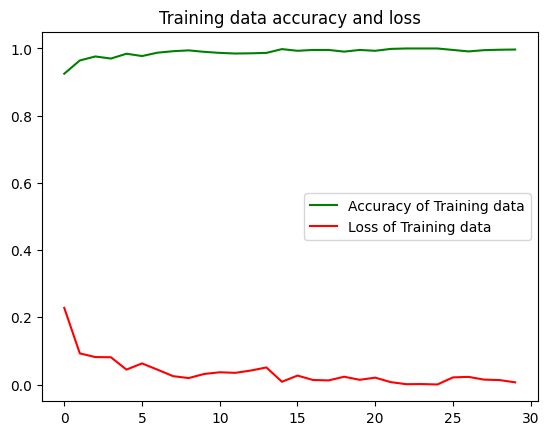

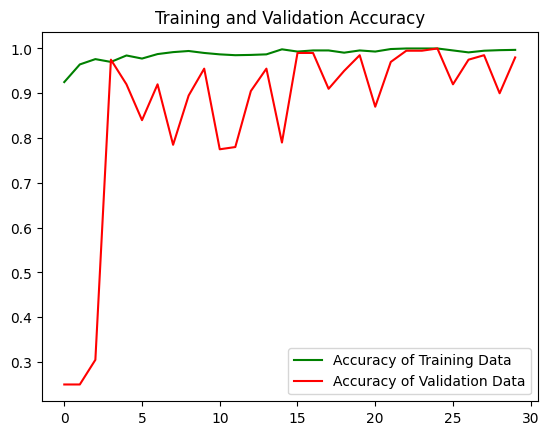

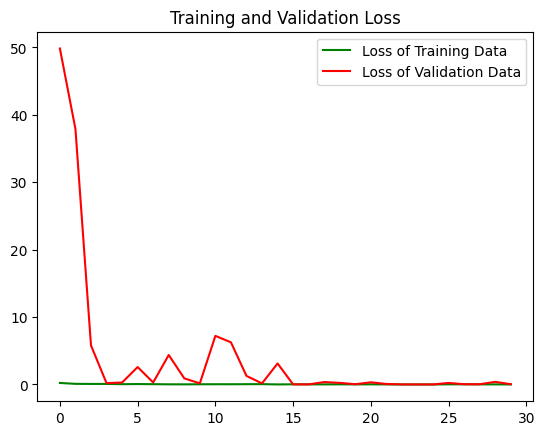

<Figure size 640x480 with 0 Axes>

In [ ]:
epochs = range(len(get_ac5))
plt.plot(epochs, get_ac5, 'g', label='Accuracy of Training data')
plt.plot(epochs, get_los5, 'r', label='Loss of Training data')
plt.title('Training data accuracy and loss')
plt.legend(loc=0)
plt.xlabel('Epochs')
plt.ylabel('Accuracy/Loss')
plt.figure()

plt.plot(epochs, get_ac5, 'g', label='Accuracy of Training Data')
plt.plot(epochs, val_acc5, 'r', label='Accuracy of Validation Data')
plt.title('Training and Validation Accuracy')
plt.legend(loc=0)
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.figure()

plt.plot(epochs, get_los5, 'g', label='Loss of Training Data')
plt.plot(epochs, val_loss5, 'r', label='Loss of Validation Data')
plt.title('Training and Validation Loss')
plt.legend(loc=0)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.figure()
plt.show()


<ipython-input-61-f3d5ad097424>:4: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(4, 4, i + 1)


1/1 [==============================] - 0s 29ms/step


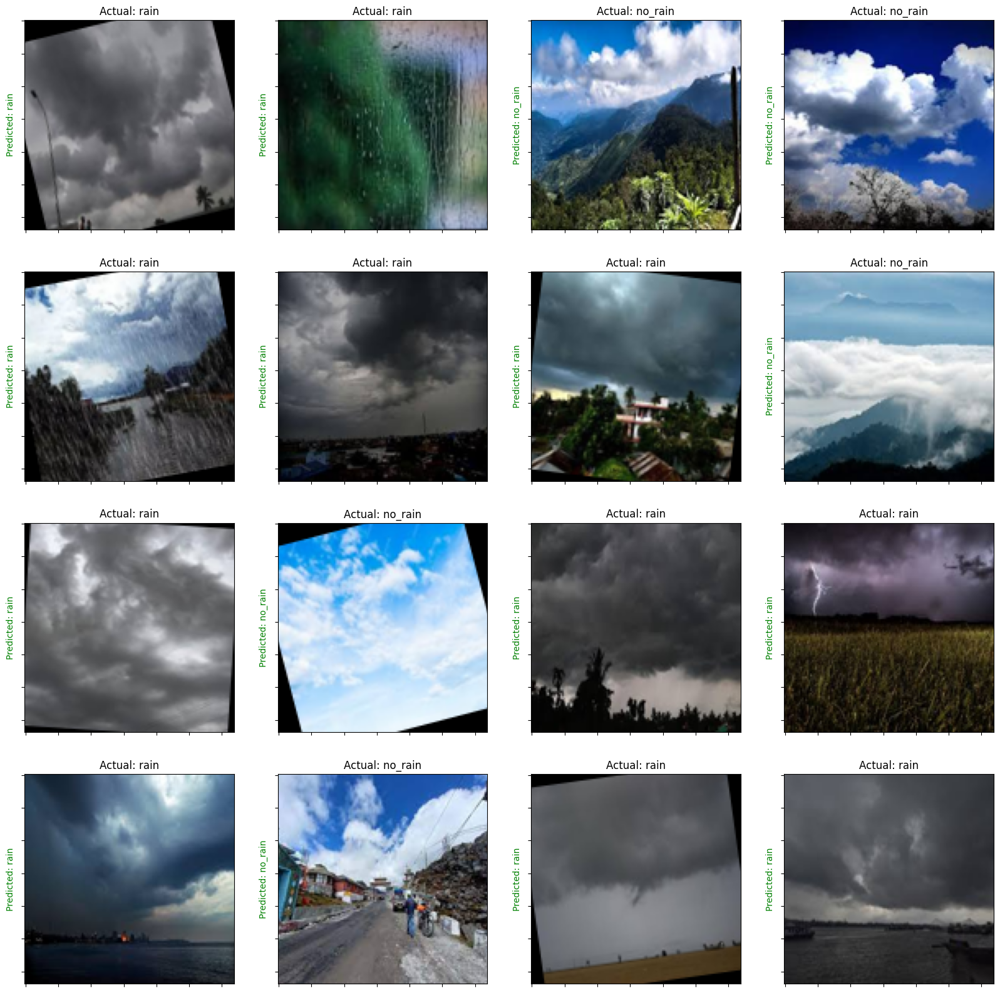

In [ ]:
plt.subplots(figsize=(20, 20))
for images, labels in test_ds.take(1):
    for i in range(16):
        ax = plt.subplot(4, 4, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        predictions = model.predict(tf.expand_dims(images[i], 0))
        score = tf.nn.softmax(predictions[0])
        if(class_names[labels[i]]==class_names[np.argmax(score)]):
            plt.title("Actual: "+class_names[labels[i]])
            plt.ylabel("Predicted: "+class_names[np.argmax(score)],fontdict={'color':'green'})

        else:
            plt.title("Actual: "+class_names[labels[i]])
            plt.ylabel("Predicted: "+class_names[np.argmax(score)],fontdict={'color':'red'})
        plt.gca().axes.yaxis.set_ticklabels([])
        plt.gca().axes.xaxis.set_ticklabels([])

In [ ]:
for img, label in test_ds.take(1):
    print(label, len(label))
    break

tf.Tensor(
[0 1 0 1 1 1 0 1 1 1 1 1 1 1 1 0 1 1 1 0 1 0 0 0 1 1 1 0 1 1 1 1 1 1 1 1 0
 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 0 1 0 0 0 1 0], shape=(64,), dtype=int32) 64


In [ ]:
loss5, accuracy5 = model.evaluate(test_ds)
print(loss5,accuracy5)

4/4 [==============================] - 1s 80ms/step - loss: 0.0247 - accuracy: 0.9850
0.02470090426504612 0.9850000143051147


In [ ]:
actual_label = []
pred_label = []
for img, label in test_ds.take(1):
    pred = model.predict(img)
    pred = np.argmax(pred, axis=1)
    print(classification_report(label,pred))

2/2 [==============================] - 2s 34ms/step
              precision    recall  f1-score   support

           0       1.00      0.92      0.96        13
           1       0.98      1.00      0.99        51

    accuracy                           0.98        64
   macro avg       0.99      0.96      0.98        64
weighted avg       0.98      0.98      0.98        64



***Comparing accuracy***

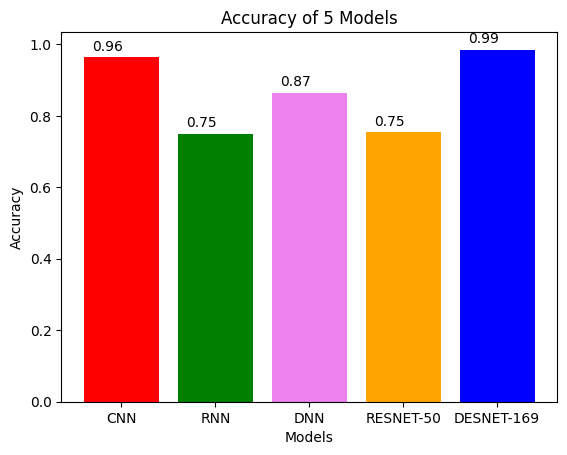